## Newton method

We use criteria as the incremental condition.

In [1]:
using Plots
using LinearAlgebra
using Roots
pyplot()

Plots.PyPlotBackend()

In [2]:
f(x) = x^3 -3x -1
fp(x) = 3x^2 -3

fp (generic function with 1 method)

In [3]:
function Newton(f,fp,x0=3.0,tol=1e-15,maxiter=1000)
    
    x1 =0.0
    vec_err = Float64[]
    for iter in 1:maxiter
        x1 = x0 - f(x0)/fp(x0)
        err = abs(x1-x0)
        push!(vec_err,err)
        if err < tol
            break
        end
        x0 = copy(x1)
    end
    return x1,vec_err
end

Newton (generic function with 4 methods)

In [4]:
# check result
x,vec_err1 = Newton(f,fp)
println("Solution by Newton method:$x")
@time Newton(f,fp)

Solution by Newton method:1.8793852415718169
  0.000006 seconds (8 allocations: 400 bytes)


(1.8793852415718169, [0.708333, 0.326159, 0.081105, 0.00499861, 1.85779e-5, 2.56174e-10, 2.22045e-16])

In [5]:
# Same as Roots.Newton() 
find_zero((f,fp), 3.0, Roots.Newton())
@time find_zero((f,fp),3.0,Roots.Newton())

  0.000054 seconds (105 allocations: 2.094 KiB)


1.8793852415718166

In [6]:
function Secant(f,x0=3.0,x1=2.8,tol=1e-15,maxiter=1000)
    x2 = 0.0
    vec_err = Float64[]
    for iter in 1:maxiter
        x2 = x1 - ((x1-x0)/(f(x1)-f(x0)))*f(x1)
        err = abs(x2-x1)
        push!(vec_err,err)
        if err < tol
            break
        end
        x0 = copy(x1)
        x1 = copy(x2)
    end
    return x2,vec_err
end

Secant (generic function with 5 methods)

In [7]:
x,vec_err2 =Secant(f)
println("Solution by secant method: $x")
@time Secant(f)

Solution by secant method: 1.8793852415718169
  0.000004 seconds (9 allocations: 544 bytes)


(1.8793852415718169, [0.564388, 0.215352, 0.111818, 0.0262859, 0.00271253, 5.859e-5, 1.20563e-7, 5.2538e-12, 2.22045e-16])

In [8]:
function Easy_newton(f,fp,x0=3.0,tol=1e-15,maxiter=1000)
    x = copy(x0)
    denom = fp(x)
    x1 = 0.0
    vec_err = Float64[]
    for iter in 1:maxiter
        x1 = x0 - f(x0)/denom
        err = abs(x1-x0)
        push!(vec_err,err)
        if err < tol
            break
        end
        x0 = copy(x1)
    end
    return x1,vec_err
end

Easy_newton (generic function with 4 methods)

In [9]:
x,vec_err3 = Easy_newton(f,fp)
println("Solution by Easy newton method: $x")
@time Easy_newton(f,fp)

Solution by Easy newton method: 1.8793852415718184
  0.000006 seconds (12 allocations: 2.453 KiB)


(1.8793852415718184, [0.708333, 0.173343, 0.0896073, 0.0526425, 0.032837, 0.0211785, 0.0139376, 0.00929015, 0.00624388, 0.00421952  …  2.37588e-14, 1.62093e-14, 1.11022e-14, 7.54952e-15, 5.32907e-15, 3.55271e-15, 2.44249e-15, 1.55431e-15, 1.11022e-15, 8.88178e-16])

In [10]:
function iterative(f,x0=3.0,β=1/36,tol=1e-15,maxiter=10000)
    x1 = 0.0
    vec_err = Float64[]
    for iter in 1:maxiter
        x1 = x0 - β*f(x0)
        err = abs(x1-x0)
        push!(vec_err,err)
        if err < tol
            break
        end
        x0 = copy(x1)
    end
    return x1,vec_err
end

iterative (generic function with 5 methods)

In [11]:
x,vec_err4 = iterative(f)
println("Solution by iterative method: $x")
@time iterative(f)

Solution by iterative method: 1.8793852415718197
  0.000007 seconds (13 allocations: 4.516 KiB)


(1.8793852415718197, [0.472222, 0.210231, 0.12486, 0.0823363, 0.0574323, 0.0414782, 0.0306597, 0.0230343, 0.0175098, 0.0134262  …  6.88338e-15, 5.32907e-15, 4.21885e-15, 3.33067e-15, 2.66454e-15, 1.9984e-15, 1.55431e-15, 1.33227e-15, 1.11022e-15, 8.88178e-16])

In [12]:
logerr1 = log.(vec_err1)
logerr2 = log.(vec_err2)
logerr3 = log.(vec_err3)
logerr4 = log.(vec_err4)

function creategrid(vector)
    len = length(vector)
    return LinRange(1,len,len)
end

grid1 = creategrid(vec_err1)
grid2 = creategrid(vec_err2)
grid3 = creategrid(vec_err3)
grid4 = creategrid(vec_err4)

138-element LinRange{Float64}:
 1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,…,133.0,134.0,135.0,136.0,137.0,138.0

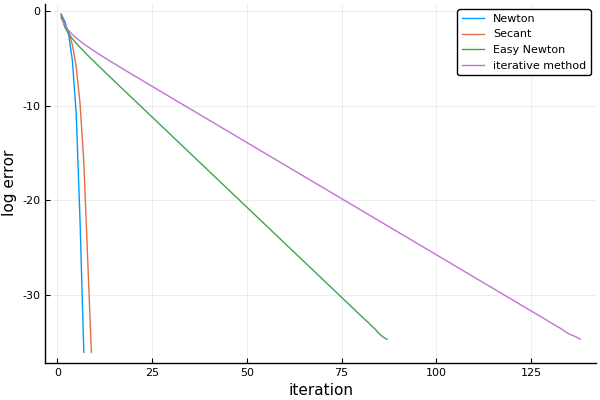

In [13]:
plot(grid1,logerr1,label="Newton")
plot!(grid2,logerr2,label ="Secant")
plot!(grid3,logerr3,label="Easy Newton")
plot!(grid4,logerr4,label="iterative method")
xlabel!("iteration")
ylabel!("log error")

For multi-dimensional case, we skip.